# CSE 252A Computer Vision I Fall 2020 - Assignment 4

## Instructor: David Kriegman
### Assignment Published On: Tuesday, December 1, 2020
### Due On: Friday, December 11, 2020 11:59 pm

## Instructions

* Review the academic integrity and collaboration policies on the course website.
* This assignment must be completed individually.
* This assignment contains theoretical and programming exercises. If you plan to submit handwritten answers for the theoretical exercises, please be sure that your writing is readable (illegible answers will not be given the benefit of the doubt!) and merge your handwritten solutions in problem order with the PDF that you create from this notebook. You can also write the answers within the notebook itself by creating Markdown cells.
* Programming aspects of this assignment must be completed using Python in this notebook.
* If you want to modify the skeleton code, you can do so. The existing code is merely meant to provide you with a framework for your solution.
* You may use Python packages for basic linear algebra (you can use NumPy or SciPy for basic operations), but you may not use packages that directly solve the problem.
* If you are unsure about using a specific package or function, then ask the instructor and teaching assistants for clarification.
* You must submit to Gradescope: 
    * (1) This notebook exported as a `.pdf` file (including any handwritten solutions scanned and merged into the PDF, if applicable).
    * (2) This notebook as an `.ipynb` file. 
* You must select the pages associated with each problem on Gradescope (for your PDF submission).
* **Late policy:** Assignments submitted late will receive a 10% grade reduction for each day late (e.g. an assignment submitted an hour after the due date will receive a 10% penalty, an assignment submitted 10 hours after the due date will receive a 10% penalty, and an assignment submitted 28 hours after the due date will receive a 20% penalty). Assignments will not be accepted 72 hours after the due date. If you require an extension (for personal reasons only), you must request one as far in advance as possible. Extensions requested close to or after the due date will only be granted for clear emergencies or clearly unforeseeable circumstances.

## Problem 1: Optical Flow [14 pts]

In this problem, the multi-resolution Lucas-Kanade algorithm for estimating optical flow will be implemented, and the data needed for this problem can be found in the folder 'optical_flow_images'.

An example optical flow output is shown below - this is not a solution, just an example output.

![title](optical_flow_images/sample_image.png)

### Part 1: Multi-resolution Lucas-Kanade implementation [6 pts]

Implement the Lucas-Kanade method for estimating optical flow. The function 'LucasKanadeMultiScale' needs to be completed. You can implement 'upsample_flow' and 'OpticalFlowRefine' as 2 building blocks in order to complete this.

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate
from scipy.signal import convolve
from scipy.ndimage import gaussian_filter,correlate

from scipy.signal import convolve, convolve2d
# from tqdm import tqdm_notebook

def grayscale(img):
    '''
    Converts RGB image to Grayscale
    '''
    gray=np.zeros((img.shape[0],img.shape[1]))
    gray=img[:,:,0]*0.2989+img[:,:,1]*0.5870+img[:,:,2]*0.1140
    return gray

def plot_optical_flow(img0,img1,U,V,titleStr, color=False):
    '''
    Plots optical flow given U,V and the images
    '''
    
    # Change t if required, affects the number of arrows
    # t should be between 1 and min(U.shape[0],U.shape[1])
    t=8
    
    # Subsample U and V to get visually pleasing output
    U1 = U[::t,::t]
    V1 = V[::t,::t]
    
    # Create meshgrid of subsampled coordinates
    r, c = img0.shape[0],img0.shape[1]
    cols,rows = np.meshgrid(np.linspace(0,c-1,c), np.linspace(0,r-1,r))
    cols = cols[::t,::t]
    rows = rows[::t,::t]
    
    # Plot optical flow
    plt.figure(figsize=(20,20))
    plt.subplot(121)
    plt.imshow(img0, alpha=0.5)
    plt.imshow(img1, alpha=0.5)
    plt.title('Overlayed Images')
    plt.subplot(122)
    if color:
        plt.imshow(img0)
    else:
        plt.imshow(grayscale(img0), cmap='gray')
    plt.quiver(cols,rows,U1,V1)
    plt.title(titleStr)
    plt.show()
    

images=[]
for i in range(1,5):
    images.append(plt.imread('optical_flow_images/im'+str(i)+'.png')[:,:288,:])
# each image after converting to gray scale is of size -> 400x288

In [9]:
# you can use interpolate from scipy
# You can implement 'upsample_flow' and 'OpticalFlowRefine' 
# as 2 building blocks in order to complete this.
import scipy.misc
from skimage.transform import resize
def upsample_flow(u_prev, v_prev):
    
    ''' You may implement this method to upsample optical flow from
    previous level
    u_prev, v_prev -> optical flow from prev level
    u, v -> upsampled optical flow to the current level
    '''
    """ ==========
    YOUR CODE HERE
    ========== """
    x = np.arange(u_prev.shape[0])*2
    y = np.arange(v_prev.shape[1])*2
    u_interp = interpolate.interp2d(x,y,u_prev.T,kind='linear')
    v_interp = interpolate.interp2d(x,y,v_prev.T,kind='linear')
    x_new = np.arange(u_prev.shape[0]*2)
    y_new = np.arange(u_prev.shape[1]*2)
    u = u_interp(x_new,y_new).T
    v = v_interp(x_new,y_new).T
    
    return u, v

In [75]:
def OpticalFlowRefine(im1,im2,window, u_prev=None, v_prev=None):
    '''
    Inputs: the two images at current level and window size
    u_prev, v_prev - previous levels optical flow
    Return u,v - optical flow at current level
    '''
    """ ==========
    YOUR CODE HERE
    ========== """
    u = np.zeros(im1.shape)
    v = np.zeros(im1.shape)
    Iy,Ix = np.gradient(im1)
    Iy = -Iy
    Ix2 = Ix*Ix
    Iy2 = Iy*Iy
    Ixy = Ix*Iy
    radi = window//2
    if u_prev.all() == None:
        u_prev = np.zeros_like(im1)
        v_prev = np.zeros_like(im1)
    else:
        u_prev,v_prev = upsample_flow(u_prev,v_prev)
        
    for row in range(radi,im1.shape[0]-radi):
        for col in range(radi,im2.shape[1]-radi):
            d_x = int(np.round(u_prev[row,col]))
            d_y = int(np.round(v_prev[row,col]))
            if (radi<=col+d_x) and (col+d_x<im1.shape[1]-radi) and \
                (radi<=row+d_y) and (row+d_y<im1.shape[0]-radi):
                im1_window = im1[row-radi:row+radi+1,col-radi:col+radi+1]
                im2_window = im2[row-radi+d_y:row+radi+d_y+1,col-radi+d_x:col+radi+d_x+1]
                It_window = im2_window-im1_window

                Ix_window = Ix[row-radi:row+radi+1,col-radi:col+radi+1]
                Iy_window = Iy[row-radi:row+radi+1,col-radi:col+radi+1]

                Ix2_window = Ix2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Ixy_window = Ixy[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Iy2_window = Iy2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Ixt = (Ix_window*It_window).sum()
                Iyt = (Iy_window*It_window).sum()
                
                M = np.array([[Ix2_window,Ixy_window],[Ixy_window,Iy2_window]])
                b = np.array([[-Ixt,-Iyt]])
                uv_vec = np.dot(np.linalg.pinv(M),b.T)
                u[row,col] = uv_vec[0]
                v[row,col] = uv_vec[1]

    u = u+u_prev
    v = v+v_prev
    
    return u, v

In [11]:
from scipy.ndimage import gaussian_filter,correlate
def LucasKanadeMultiScale(im1,im2,window, numLevels=2):
    '''
    Implement the multi-resolution Lucas kanade algorithm
    Inputs: the two images, window size and number of levels
    if numLevels = 1, then compute optical flow at only the given image level.
    Returns: u, v - the optical flow
    '''
    
    """ ==========
    YOUR CODE HERE
    ========== """
    # You can call OpticalFlowRefine iteratively
    img1_layer = []
    img2_layer = []
    img1_layer.append(im1)
    img2_layer.append(im2)
    for i in range(1,numLevels):
        img1_layer.append(gaussian_filter(im1[::2**i,::2**i],sigma = 1))
        img2_layer.append(gaussian_filter(im2[::2**i,::2**i],sigma = 1))
        
    u_prev=np.array([None])
    v_prev=np.array([None])
    for i in range(numLevels-1,-1,-1):
        u,v = OpticalFlowRefine(img1_layer[i],img2_layer[i],window,u_prev,v_prev)
        u_prev = u
        v_prev = v
    return u, v


### Part 2: Number of levels [2 pts]

Plot optical flow for the pair of images im1 and im2 for different number of levels mentioned below. Comment on the results and justify.<br>
(i) window size = 13, numLevels = 1<br>
(ii) window size = 13, numLevels = 3<br>
(iii) window size = 13, numLevels = 5<br>
So, you are expected to provide 3 outputs here<br>

Note: if numLevels = 1, then it means the optical flow is only computed at the image resolution i.e. no downsampling

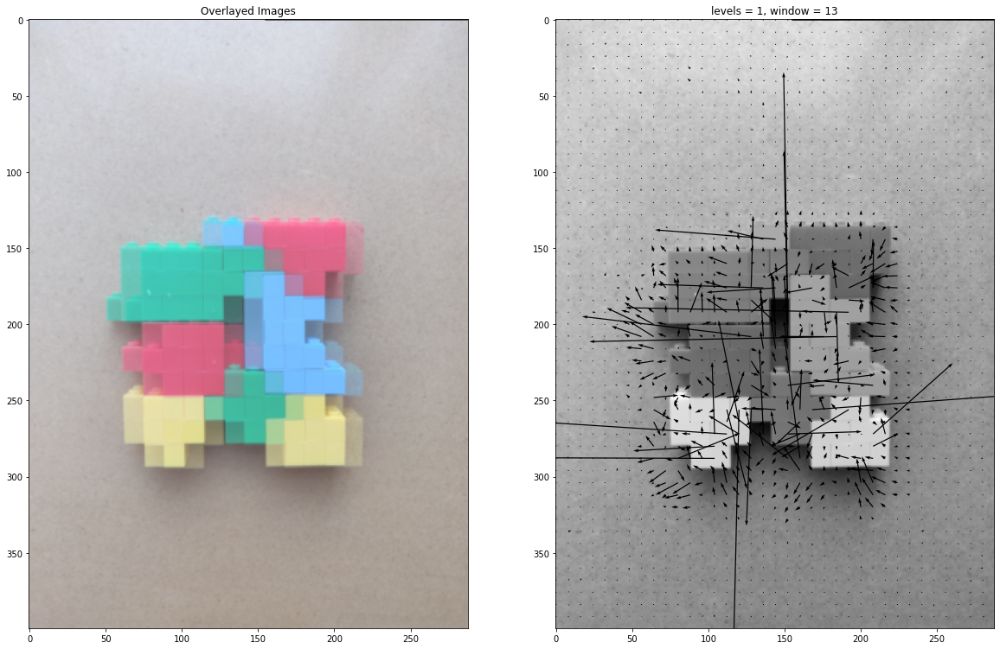

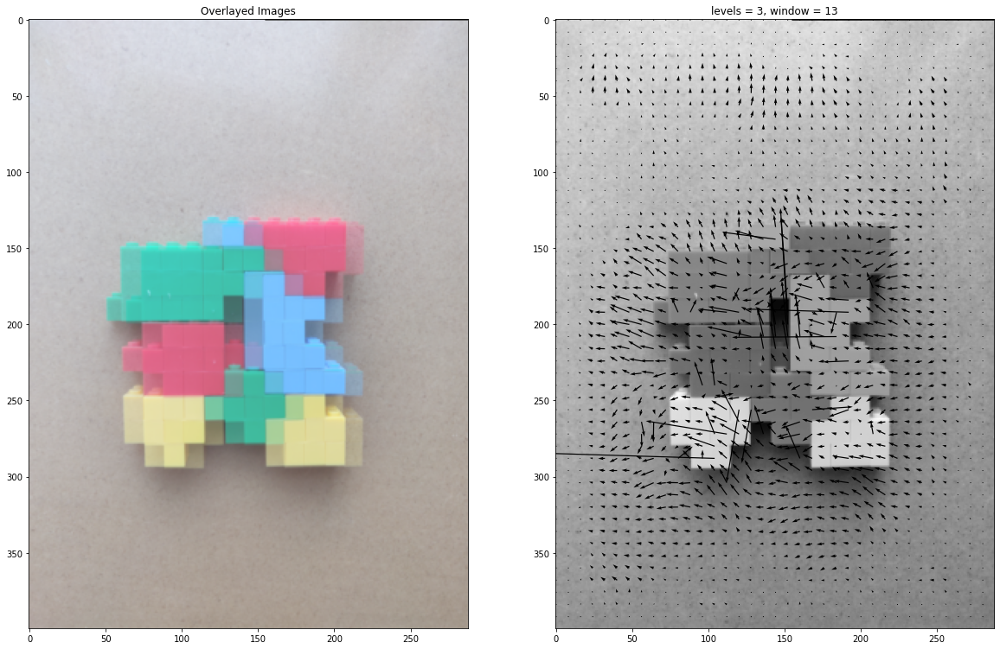

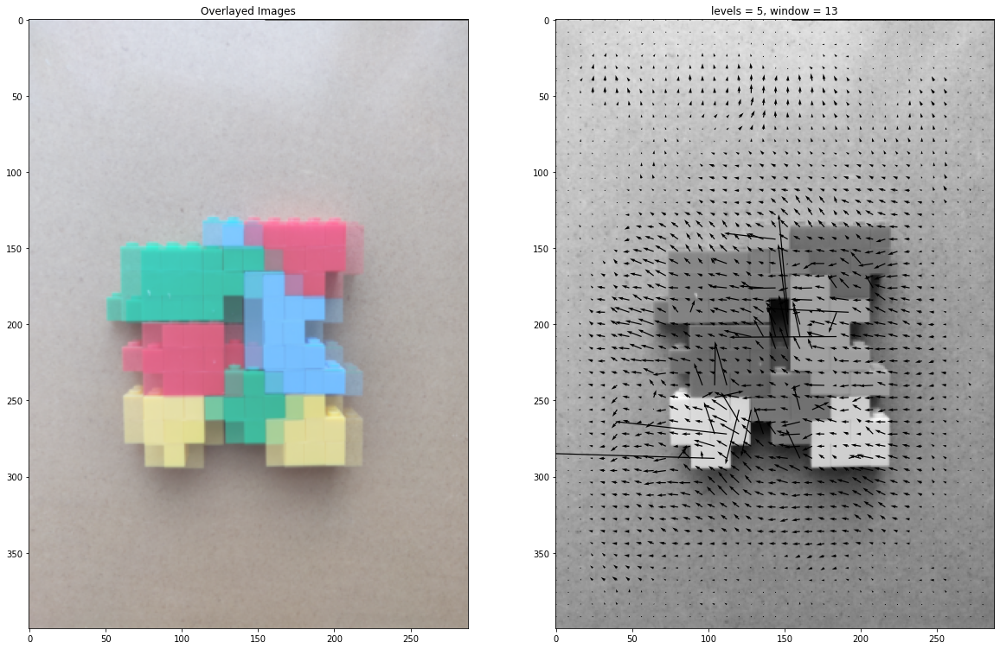

In [12]:
# Example code to generate output
window=13
numLevels=1
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window))

numLevels=3
# Plot
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window))

numLevels=5
# Plot
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window))


#### Your Comments on the results of Part 2:
Answer: The more number of levels, the more accurate of our LK algorithm. Since more number of levels means the more information and can fine-tune the optical flow.

### Part 3: Window size [3 pts]

Plot optical flow for the pair of images im1 and im2 for at least 3 different window sizes which leads to observable difference in the results. Comment on the effect of window size on results and justify. For this part fix the number of levels to be 3.

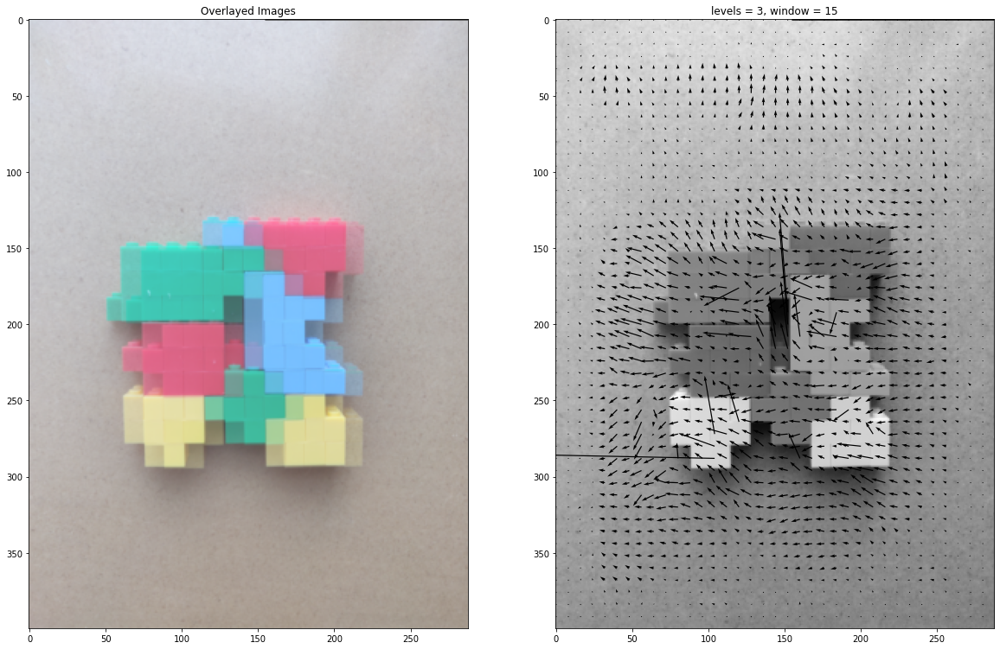

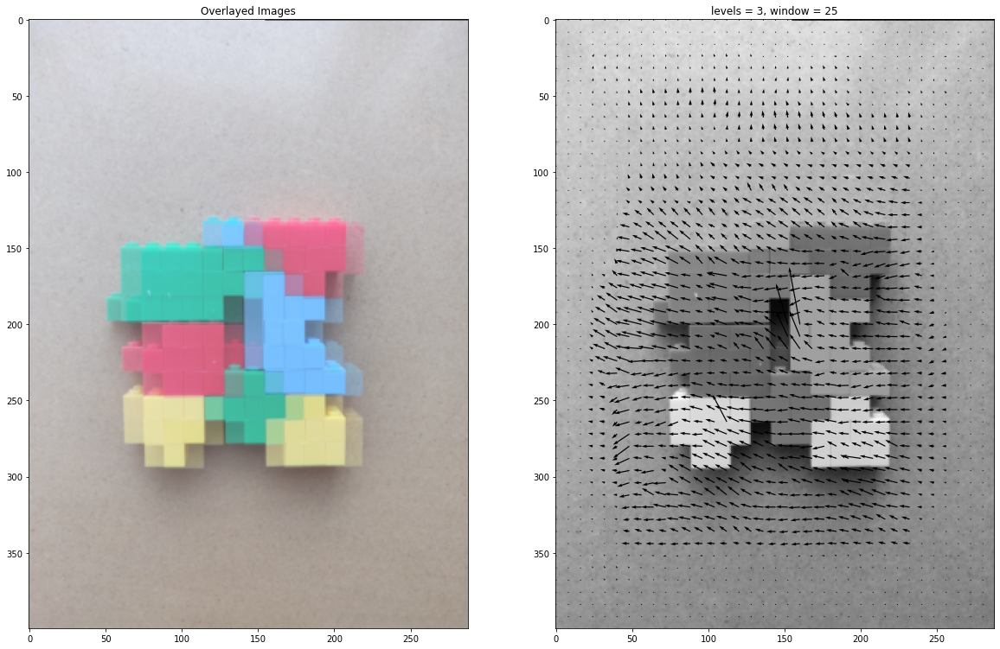

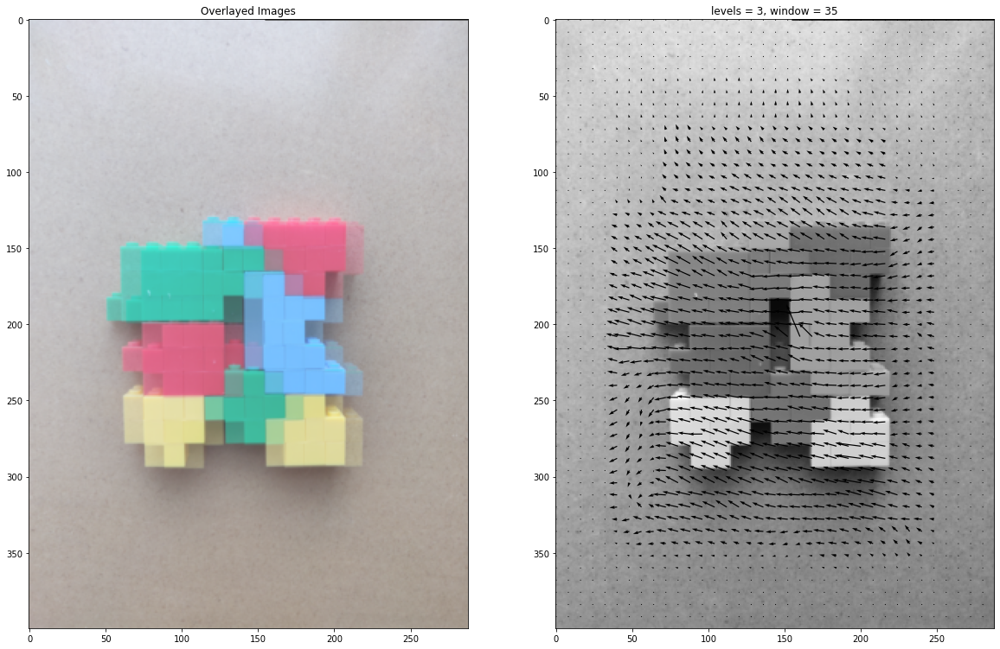

In [76]:
# Example code, change as required
numLevels=3

w1, w2, w3 = 15, 25, 35
for window in [w1, w2, w3]:
    U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                              window,numLevels)
    plot_optical_flow(images[0],images[1], U,V, \
                      'levels = ' + str(numLevels) + ', window = '+str(window))

#### Your Comments on the results of Part 3:
The larger the window size, the more reasonable result of our algorithm.
<br> Because when we compute the optical flow of a pixel at $(x,y)$, it results are based on the whole windowsize's other pixels previous optical flow, which means more information.
<br> So the larger the windowsize can contain more information. However, we cannot make the windowsize too large, or we cannot have the local information, so that may lead to some error.

### Part 4: Other pairs [3 pts]

Find optical flow for the pairs (im1,im2), (im1,im3), (im1,im4) using one good window size and number of levels. Does the optical flow result seem consistent with visual inspection? Comment on the type of motion indicated by results and visual inspection and explain why they might be consistent or inconsistent.

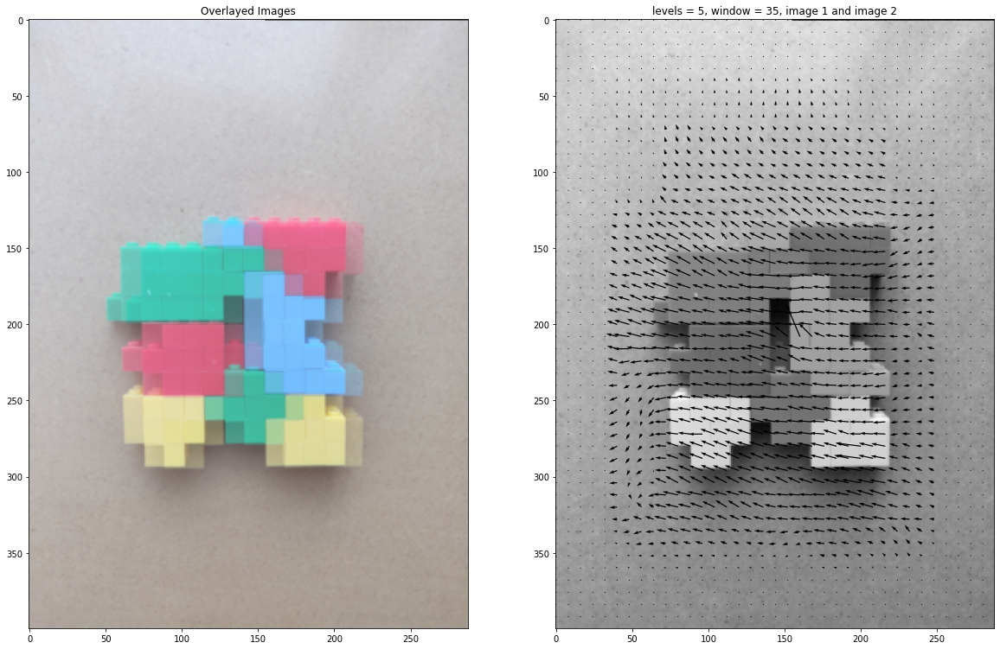

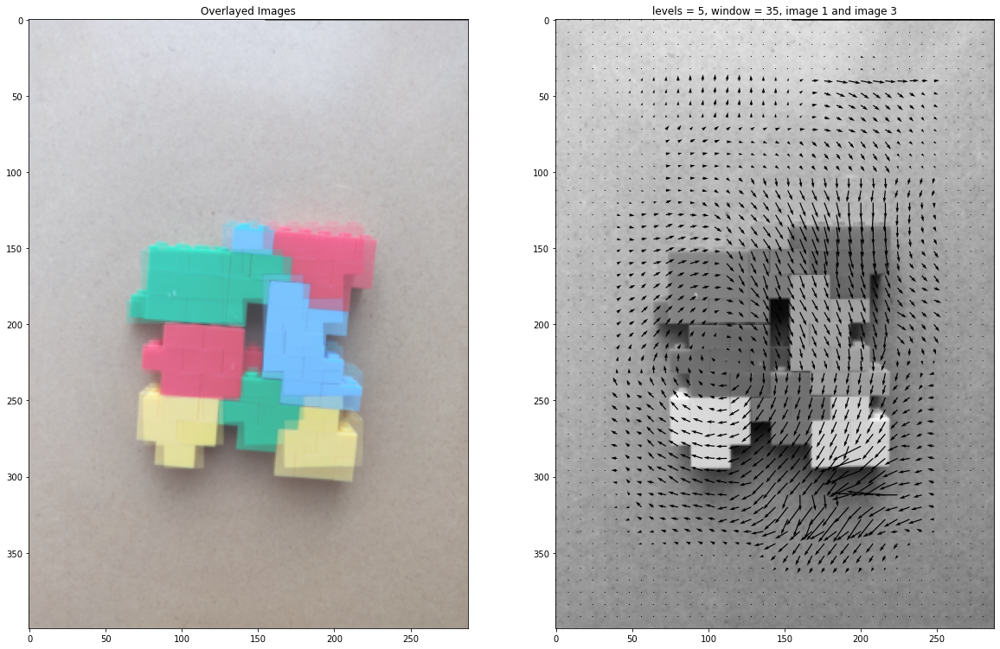

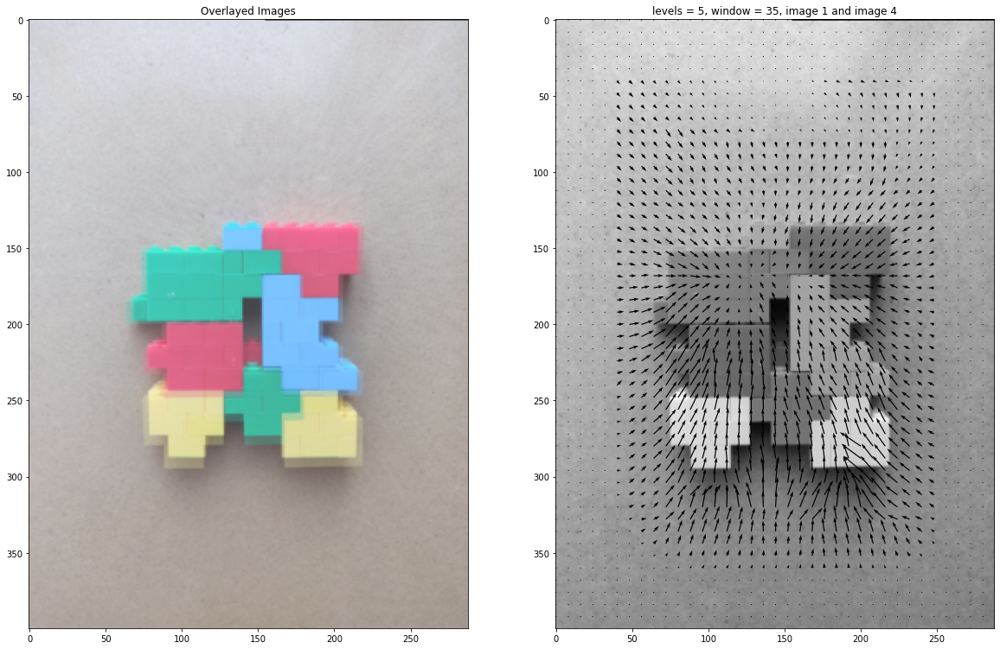

In [18]:
# Your code here
# use one fixed window and numLevels for all pairs
# Example code to generate output
window=35
numLevels=5
U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 2')


U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[2]),\
                          window,numLevels)
plot_optical_flow(images[0],images[2],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 3')


U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[3]),\
                          window,numLevels)
plot_optical_flow(images[0],images[3],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 4')

#### Your Comments on the results of Part 4:
I use the window size: 35 and number of level: 5, because based on the above discussion, I think the larger the windowsize and number of level, the more reasonable our result will be.
<br> And the results proved my thoughts. The first picture shows that the object is moving left. The second picture shows that the object is rotating. The last picture shows that the object is falling on the ground. All the optical flows are very perfet.


## Problem 2: RGB Optical Flow[10 pts]

In this problem, we extend optical flow to RGB images. 

### Part 1: Derivation [5 pts]

In lecture, we used brightness constancy constraint and taylor series expansion to come up with the optical flow equation 
$$I_xu +I_yv+I_t = 0$$  and we derived the Lucas-Kanade least squares solution assuming same velocity over a patch as:

$$
\left(\begin{array}{cc} 
\sum I_x^2 & \sum I_xI_y\\
\sum I_xI_y & \sum I_y^2
\end{array}\right)
\left(\begin{array}{c} 
u \\ 
v 
\end{array}\right) = -
\left(\begin{array}{c} 
\sum I_xI_t\\ 
\sum I_yI_t
\end{array}\right)
$$ 

Derive similar equation for RGB images under a color constancy constraint by applying the brightness constancy constraint to each of the channels, and formulating a cost function over the thee channels.


#### Your derivation here:



If we use the conservation of RGB instead of brightness, then we can have:
<br> $R(x + u\delta t, y + v\delta t, t + \delta t) = R(x, y, t)$
<br> $G(x + u\delta t, y + v\delta t, t + \delta t) = G(x, y, t)$
<br> $B(x + u\delta t, y + v\delta t, t + \delta t) = B(x, y, t)$
<br> Similarly, use Talyor Series expansion of LHS about $R(\cdot),G(\cdot),B(\cdot)$:
<br> $R_x u + R_y v + R_t = 0$
<br> $G_x u + G_y v + G_t = 0$
<br> $B_x u + B_y v + B_t = 0$
<br> Assume a single velocity $(u, v)$ for pixels within an image patch $\Omega$:
<br> $RGB(u,v) = \sum_{x,y\in\Omega} (R_x u + R_y v + R_t)^2 + (G_x u + G_y v + G_t)^2 + (B_x u + B_y v + B_t)^2$, $RGB(u,v)$ is minimized when partial derivatives equal to zero.
<br> $0 = \frac{dRGB(u, v)}{d u} = \sum 2R_x(R_x u+R_y v + R_t) + 2 G_x(G_x u + G_y v + G_t) + 
2B_x(B_x u + B_y v + B_t) \\
\sum(R_x^2 + 2G_x^2 + 2B_x^2) u + \sum (R_xR_y + G_xG_y + B_xB_y) v + (R_xR_t + G_xG_t + G_tB_t)$
<br> $0 = \frac{dRGB(u,v)}{d v} = \sum (R_xR_y + G_xG_y + B_xB_y) u + \sum(R_y^2 + G_y^2 + B_y^2) v +  + (R_yR_t + G_yG_t + B_yB_t)$
<br> The above equation can be written as a linear equation:
<br>$\begin{bmatrix}
\sum R_x^2 + G_x^2 + B_x^2 & \sum R_xR_y + G_xG_y + B_xB_y\\
\sum R_xR_y + G_xG_y + B_xB_y & \sum R_y^2 + G_y^2 + B_y^2
\end{bmatrix}
\begin{bmatrix}
u \\
v
\end{bmatrix} = 
\begin{bmatrix}
-\sum(R_xR_t + G_xG_t + B_xB_t)\\
-\sum(R_yR_t + G_yG_t + B_yB_t)
\end{bmatrix}$



### Part 2: Computing Flow [4pts]

Complete the functions LucasKanadeMultiScaleRGB and OpticalFlowRefineRGB and run it for window size = 13 and number of levels = 3 

In [236]:
# you can use interpolate from scipy
# You can implement 'upsample_flow' and 'OpticalFlowRefine' 
# as 2 building blocks in order to complete this.
import scipy.misc
from skimage.transform import resize
def upsample_flow(u_prev, v_prev):
    
    ''' You may implement this method to upsample optical flow from
    previous level
    u_prev, v_prev -> optical flow from prev level
    u, v -> upsampled optical flow to the current level
    '''
    """ ==========
    YOUR CODE HERE
    ========== """
    x = np.arange(u_prev.shape[0])*2
    y = np.arange(v_prev.shape[1])*2
    u_interp = interpolate.interp2d(x,y,u_prev.T,kind='linear')
    v_interp = interpolate.interp2d(x,y,v_prev.T,kind='linear')
    x_new = np.arange(u_prev.shape[0]*2)
    y_new = np.arange(u_prev.shape[1]*2)
    u = u_interp(x_new,y_new).T
    v = v_interp(x_new,y_new).T
    
    return u, v

In [237]:
def OpticalFlowRefineRGB(im1,im2,window, u_prev=None, v_prev=None):
    '''
    Inputs: the two RGB images at current level and window size
    u_prev, v_prev - previous levels optical flow
    Return u,v - optical flow at current level
    '''
    """ ==========
    YOUR CODE HERE
    ========== """
    u = np.zeros((im1.shape[0], im1.shape[1]))
    v = np.zeros((im1.shape[0], im1.shape[1]))

    radi = window//2
    Ry, Rx = np.gradient(im1[:,:,0])
    Ry = -Ry
    Rx2 = Rx*Rx
    Ry2 = Ry*Ry
    Rxy = Rx*Ry
    
    Gy, Gx = np.gradient(im1[:,:,1])
    Gy = -Gy
    Gx2 = Gx*Rx
    Gy2 = Gy*Gy
    Gxy = Gx*Gy
    
    By, Bx = np.gradient(im1[:,:,2])
    By = -By
    Bx2 = Bx*Rx
    By2 = By*By
    Bxy = Bx*By
    
    if u_prev.all() == None:
        u_prev = np.zeros_like(im1[:,:,0])
        v_prev = np.zeros_like(im1[:,:,0])
    else:
        u_prev,v_prev = upsample_flow(u_prev,v_prev)
    for row in range(radi,im1.shape[0]-radi):
        for col in range(radi,im2.shape[1]-radi):
            R_dx = int(np.round(u_prev[row,col]))
            R_dy = int(np.round(v_prev[row,col]))
            G_dx = int(np.round(u_prev[row,col]))
            G_dy = int(np.round(v_prev[row,col]))
            B_dx = int(np.round(u_prev[row,col]))
            B_dy = int(np.round(v_prev[row,col]))
            flag = radi <= col + R_dx and \
                    col + R_dx<im1.shape[1] - radi and \
                    radi <= row + R_dy and \
                    row + R_dy<im1.shape[0] - radi and \
                    radi <= col + G_dx and \
                    col + G_dx<im1.shape[1] - radi and \
                    radi <= row + G_dy and \
                    row + G_dy<im1.shape[0] - radi and \
                    radi <= col + B_dx and \
                    col + B_dx<im1.shape[1] - radi and \
                    radi <= row + B_dy and \
                    row + B_dy<im1.shape[0] - radi
            if flag:
                #im1_window = im1[row-radi:row+radi+1,col-radi:col+radi+1]
                #im2_window = im2[row-radi+d_y:row+radi+d_y+1,col-radi+d_x:col+radi+d_x+1]
                #It_window = im2_window-im1_window

                #Ix_window = Ix[row-radi:row+radi+1,col-radi:col+radi+1]
                #Iy_window = Iy[row-radi:row+radi+1,col-radi:col+radi+1]

                #Ix2_window = Ix2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                #Ixy_window = Ixy[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                #Iy2_window = Iy2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                #Ixt = (Ix_window*It_window).sum()
                #Iyt = (Iy_window*It_window).sum()
                Rt_window = im1[row-radi:row+radi+1,col-radi:col+radi+1,0] - im2[row-radi+R_dy:row+radi+R_dy+1,col-radi+R_dx:col+radi+R_dx+1,0]
                Gt_window = im1[row-radi:row+radi+1,col-radi:col+radi+1,1] - im2[row-radi+G_dy:row+radi+G_dy+1,col-radi+G_dx:col+radi+G_dx+1,1]
                Bt_window = im1[row-radi:row+radi+1,col-radi:col+radi+1,2] - im2[row-radi+B_dy:row+radi+B_dy+1,col-radi+B_dx:col+radi+B_dx+1,2]

                Rx_window = Rx[row-radi:row+radi+1,col-radi:col+radi+1]
                Gx_window = Rx[row-radi:row+radi+1,col-radi:col+radi+1]
                Bx_window = Rx[row-radi:row+radi+1,col-radi:col+radi+1]
                
                Ry_window = Ry[row-radi:row+radi+1,col-radi:col+radi+1]
                Gy_window = Ry[row-radi:row+radi+1,col-radi:col+radi+1]
                By_window = Ry[row-radi:row+radi+1,col-radi:col+radi+1]
                
                Rx2_window = Rx2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Rxy_window = Rxy[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Ry2_window = Ry2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Gx2_window = Gx2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Gxy_window = Gxy[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Gy2_window = Gy2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Bx2_window = Bx2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                Bxy_window = Bxy[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                By2_window = By2[row-radi:row+radi+1,col-radi:col+radi+1].sum()
                
                Rxt = (Rx_window*Rt_window).sum()
                Gxt = (Gx_window*Gt_window).sum()
                Bxt = (Bx_window*Bt_window).sum()
                
                Ryt = (Ry_window*Rt_window).sum()
                Gyt = (Gy_window*Gt_window).sum()
                Byt = (By_window*Bt_window).sum()
                
                M = np.array([[Rx2_window + Gx2_window + Bx2_window, Rxy_window + Gxy_window + Bxy_window], 
                              [Rxy_window + Gxy_window + Bxy_window, Ry2_window + Gy2_window + By2_window]])
#                 M = np.array([[Ix2_window,Ixy_window],[Ixy_window,Iy2_window]])
#                 b = np.array([[-Ixt,-Iyt]])
                b = np.array([[- Rxt - Gxt - Bxt, - Ryt - Gyt - Byt]])
                uv_vec = np.dot(np.linalg.pinv(M),b.T)
                u[row,col] = uv_vec[0]
                v[row,col] = uv_vec[1]
    u = u+u_prev
    v = v+v_prev
    
    return u, v

In [238]:
def LucasKanadeMultiScaleRGB(im1,im2,window, numLevels=2):
    '''
    Implement the multi-resolution Lucas kanade algorithm for RGB images
    Inputs: the two RGB images, window size and number of levels
    if numLevels = 1, then compute optical flow at only the given image level.
    Returns: u, v - the optical flow
    '''
    
    """ ==========
    YOUR CODE HERE
    ========== """
    # You can call OpticalFlowRefineRGB iteratively
    # You can call OpticalFlowRefine iteratively
    img1_layer = []
    img2_layer = []
    img1_layer.append(im1)
    img2_layer.append(im2)
    for i in range(1,numLevels):
        img1_layer.append(gaussian_filter(im1[::2**i,::2**i],sigma = 1))
        img2_layer.append(gaussian_filter(im2[::2**i,::2**i],sigma = 1))
    u_prev=np.array([None])
    v_prev=np.array([None])
    for i in range(numLevels-1,-1,-1):
        u,v = OpticalFlowRefineRGB(img1_layer[i],img2_layer[i],window,u_prev,v_prev)
        u_prev = u
        v_prev = v
    return u, v
    return u_prev, v_prev

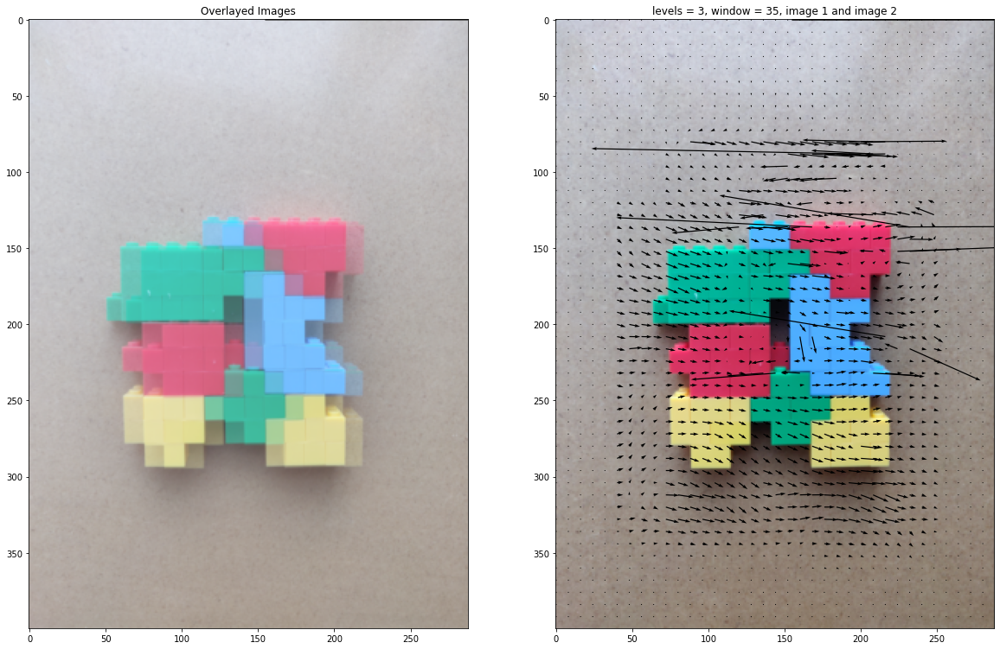

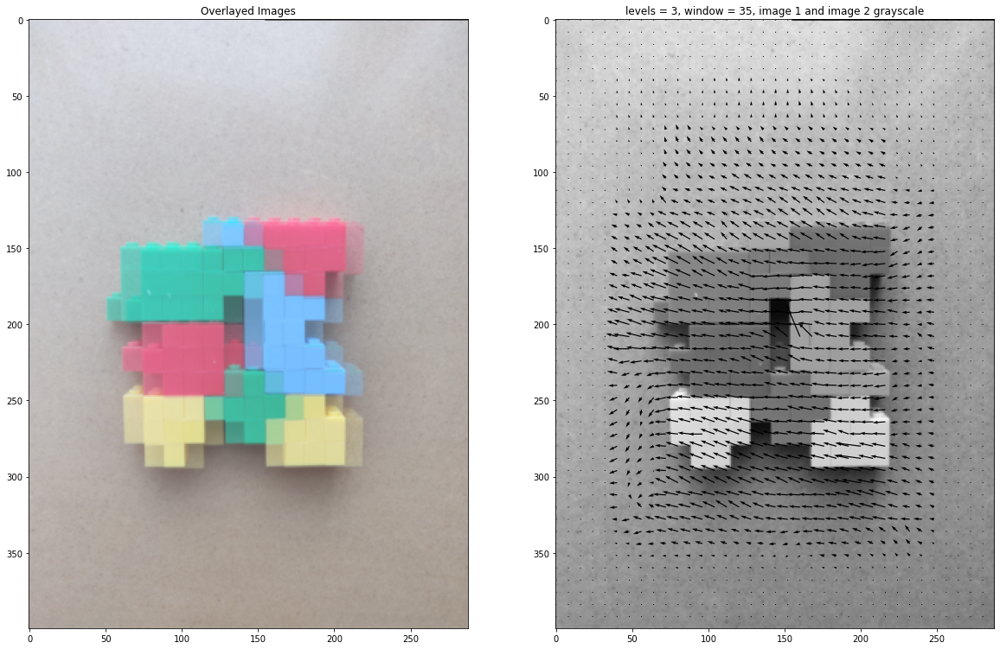

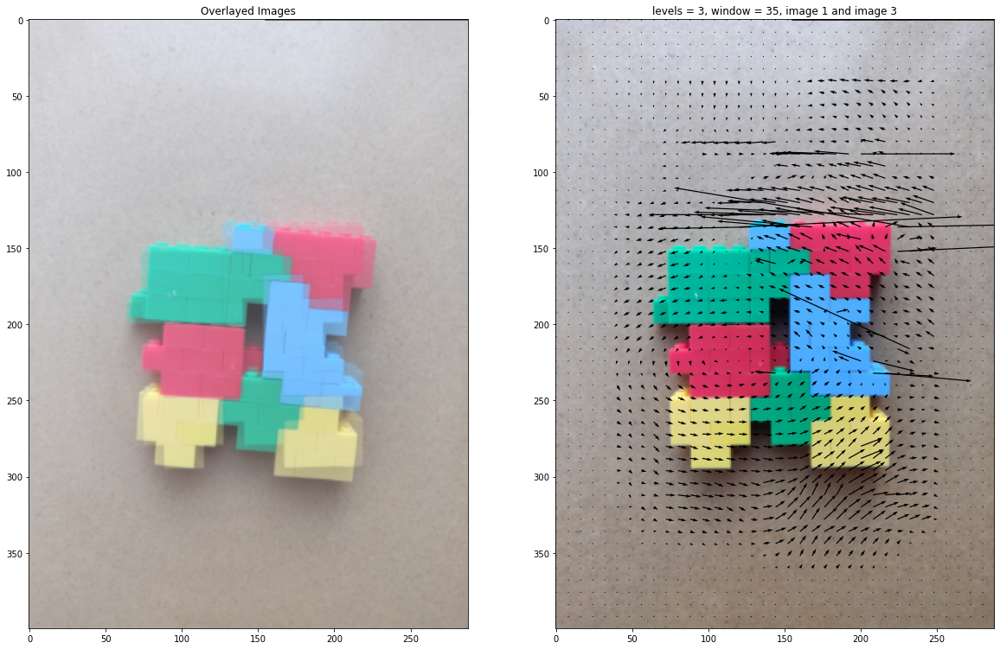

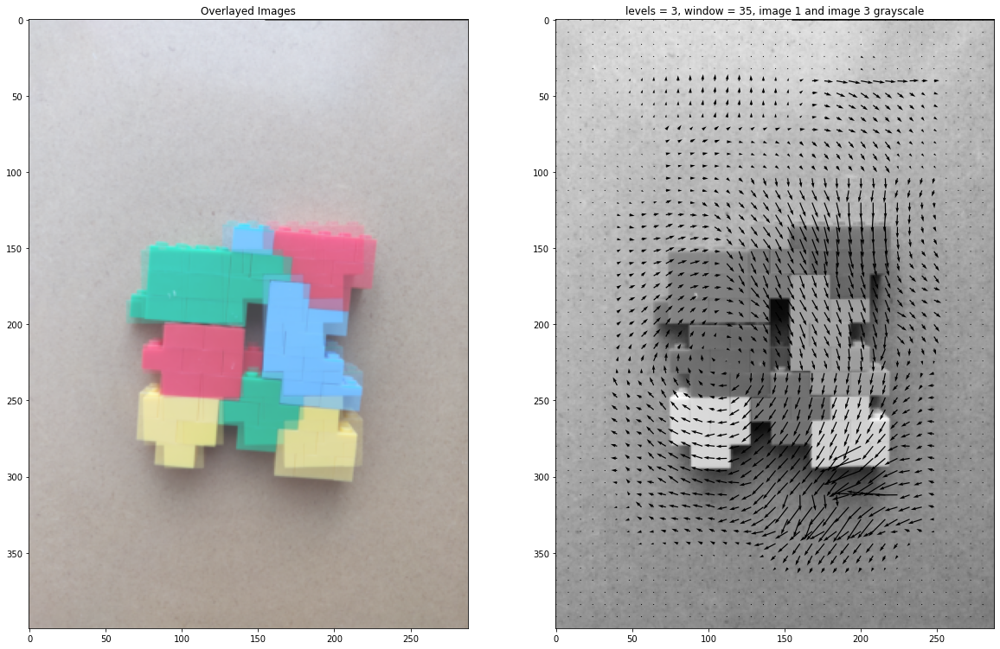

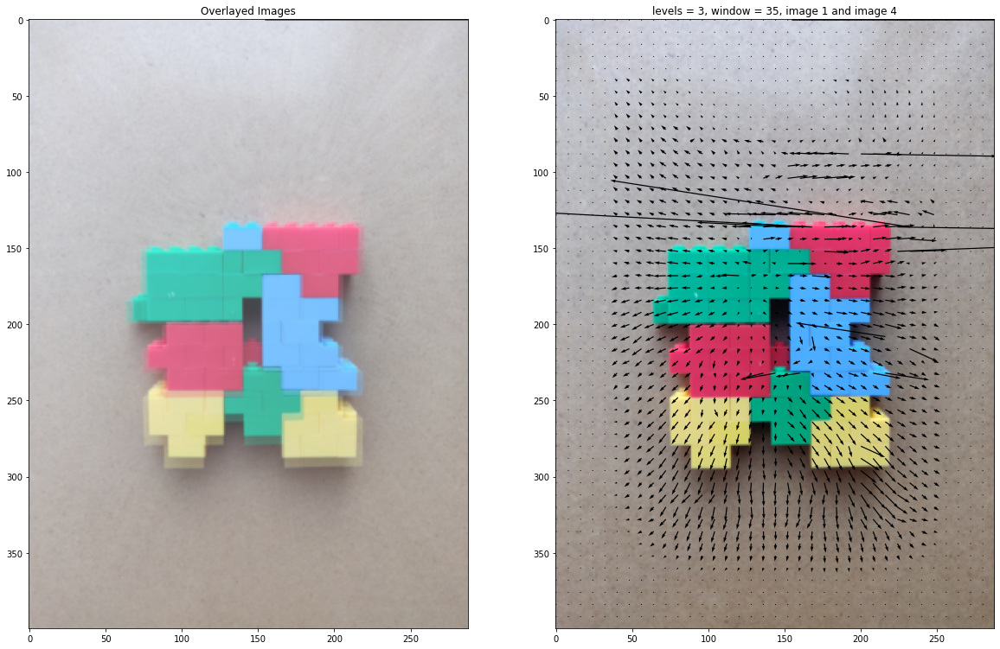

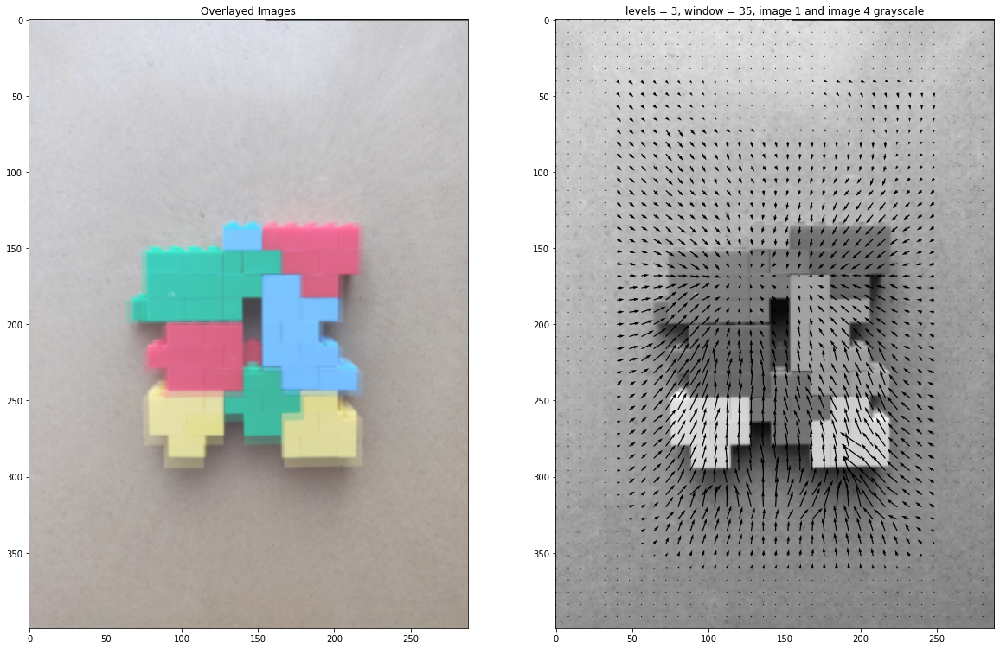

In [240]:
# Your code here
# use one fixed window and numLevels for all pairs
# Example code to generate output
window=35
numLevels=3
U,V=LucasKanadeMultiScaleRGB(images[0][:,:,:3],images[1][:,:,:3],\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 2', color=True)

U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[1]),\
                          window,numLevels)
plot_optical_flow(images[0],images[1],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 2 grayscale')



U,V=LucasKanadeMultiScaleRGB(images[0][:,:,:3],images[2][:,:,:3],\
                          window,numLevels)
plot_optical_flow(images[0],images[2],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 3', color=True)

U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[2]),\
                          window,numLevels)
plot_optical_flow(images[0],images[2],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 3 grayscale')




U,V=LucasKanadeMultiScaleRGB(images[0][:,:,:3],images[3][:,:,:3],\
                          window,numLevels)
plot_optical_flow(images[0],images[3],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 4', color=True)

U,V=LucasKanadeMultiScale(grayscale(images[0]),grayscale(images[3]),\
                          window,numLevels)
plot_optical_flow(images[0],images[3],U,V, \
                  'levels = ' + str(numLevels) + ', window = '+str(window) + ', image 1 and image 4 grayscale')



### Part 3 (1pt):

Comment on differences in outputs of the RGB optical flow with the grayscale version.

The rgb optical flow performs worse than grayscale version. Because:
<br>
I think the RGB optical flow may have some unreasonable error (very long arrows shown in the figure). The reason may be that each channel is separate, but the total is the sum of each channel, which means that if we compute for the optical flow which minimize the error of 3 channel will interference each other.

## Problem 3: Machine Learning [12 pts]

In this problem, you will implement several machine learning solutions for computer vision problems.

### Part 1: Initial setup [1 pts]

Follow the directions on https://pytorch.org/get-started/locally/ to install Pytorch on your computer. 

Note: You will not need GPU support for this assignment so don't worry if you don't have one. Furthermore, installing with GPU support is often more difficult to configure so it is suggested that you install the CPU only version. TA's will not provide any support related to GPU or CUDA.

Run the torch import statements below to verify your instalation.

Download the MNIST data from http://yann.lecun.com/exdb/mnist/.

Download the 4 zipped files, extract them into one folder, and change the variable 'path' in the code below. (Code taken from https://gist.github.com/akesling/5358964 )

Plot one random example image corresponding to each label from training data.

In [8]:
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch
from torch.autograd import Variable

x = torch.rand(5, 3)
print(x)

tensor([[0.5525, 0.8691, 0.7886],
        [0.0907, 0.8967, 0.5434],
        [0.8535, 0.8061, 0.1597],
        [0.5395, 0.7679, 0.3895],
        [0.6090, 0.8945, 0.5037]])


In [9]:
import os
import struct

# Change path as required
path = "./mnist/"

def read(dataset = "training", datatype='images'):
    """
    Python function for importing the MNIST data set.  It returns an iterator
    of 2-tuples with the first element being the label and the second element
    being a numpy.uint8 2D array of pixel data for the given image.
    """

    if dataset is "training":
        fname_img = os.path.join(path, 'train-images-idx3-ubyte')
        fname_lbl = os.path.join(path, 'train-labels-idx1-ubyte')
    elif dataset is "testing":
        fname_img = os.path.join(path, 't10k-images-idx3-ubyte')
        fname_lbl = os.path.join(path, 't10k-labels-idx1-ubyte')

    # Load everything in some numpy arrays
    with open(fname_lbl, 'rb') as flbl:
        magic, num = struct.unpack(">II", flbl.read(8))
        lbl = np.fromfile(flbl, dtype=np.int8)

    with open(fname_img, 'rb') as fimg:
        magic, num, rows, cols = struct.unpack(">IIII", fimg.read(16))
        img = np.fromfile(fimg, dtype=np.uint8).reshape(len(lbl), rows, cols)
    
    if(datatype=='images'):
        get_data = lambda idx: img[idx]
    elif(datatype=='labels'):
        get_data = lambda idx: lbl[idx]

    # Create an iterator which returns each image in turn
    for i in range(len(lbl)):
        yield get_data(i)
        
trainData=np.array(list(read('training','images')))
trainLabels=np.array(list(read('training','labels')))
testData=np.array(list(read('testing','images')))
testLabels=np.array(list(read('testing','labels')))

In [10]:
# Understand the shapes of the each variable carying data
print(trainData.shape, trainLabels.shape)
print(testData.shape, testLabels.shape)

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


/home/zhizuo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  app.launch_new_instance()


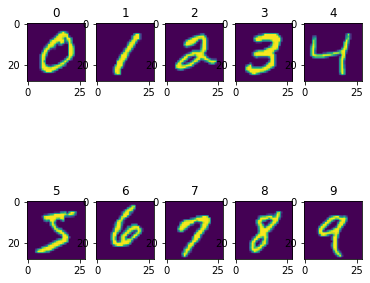

In [37]:
# display one image from each label
""" ==========
YOUR CODE HERE
========== """
import matplotlib.pyplot as plt

img_list = []
num_list = []
i = 0
while len(img_list) < 10:
    if trainLabels[i] not in num_list:
        num_list.append(trainLabels[i])
        img_list.append((trainLabels[i], trainData[i]))
    i += 1
img_list.sort()
img_list = np.array(img_list)
plt.figure(figsize=(6,6))
for i in range(10):
    plt.subplot2grid((2,5), (i//5,i%5))
    plt.title("{}".format(i))
    plt.imshow(img_list[i][1].reshape(28,28))
plt.show()

Some helper functions are given below.

In [12]:
# a generator for batches of data
# yields data (batchsize, 28, 28) and labels (batchsize)
# if shuffle, it will load batches in a random order
from tqdm import tqdm
def DataBatch(data, label, batchsize, shuffle=True):
    n = data.shape[0]
    if shuffle:
        index = np.random.permutation(n)
    else:
        index = np.arange(n)
    for i in range(int(np.ceil(n/batchsize))):
        inds = index[i*batchsize : min(n,(i+1)*batchsize)]
        yield data[inds], label[inds]

# tests the accuracy of a classifier
def test(testData, testLabels, classifier):
    batchsize=50
    correct=0.
    for data,label in tqdm(DataBatch(testData,testLabels,batchsize,shuffle=False)):
        prediction = classifier(data)
        correct += np.sum(prediction==label)
        
    return correct/testData.shape[0]*100

# a sample classifier
# given an input it outputs a random class
class RandomClassifier():
    def __init__(self, classes=10):
        self.classes=classes
    def __call__(self, x):
        return np.random.randint(self.classes, size=x.shape[0])

randomClassifier = RandomClassifier()
print('Random classifier accuracy: %f' % 
      test(testData, testLabels, randomClassifier))

200it [00:00, 39894.46it/s]

Random classifier accuracy: 9.680000


### Part 2: Confusion Matrix [2 pts]
Here you will implement a function that computes the confusion matrix for a classifier.
The matrix (M) should be nxn where n is the number of classes.
Entry M[i,j] should contain the fraction of images of class i that was classified as class j.
Can you justify the accuracy given by the random classifier?

0.0993


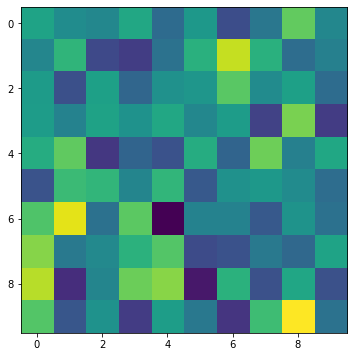

[[0.1  0.1  0.1  0.11 0.09 0.1  0.09 0.1  0.11 0.1 ]
 [0.1  0.11 0.09 0.09 0.1  0.11 0.12 0.11 0.09 0.1 ]
 [0.1  0.09 0.1  0.09 0.1  0.1  0.11 0.1  0.1  0.09]
 [0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.09 0.11 0.09]
 [0.11 0.11 0.09 0.09 0.09 0.11 0.09 0.11 0.1  0.1 ]
 [0.09 0.11 0.11 0.1  0.11 0.09 0.1  0.1  0.1  0.09]
 [0.11 0.12 0.09 0.11 0.08 0.1  0.1  0.09 0.1  0.09]
 [0.11 0.1  0.1  0.11 0.11 0.09 0.09 0.1  0.09 0.1 ]
 [0.12 0.08 0.1  0.11 0.11 0.08 0.11 0.09 0.1  0.09]
 [0.11 0.09 0.1  0.09 0.1  0.1  0.09 0.11 0.12 0.1 ]]


In [13]:
# Using the tqdm module to visualize run time is suggested
from tqdm import tqdm

# It would be a good idea to return the accuracy, along with the confusion 
# matrix, since both can be calculated in one iteration over test data, to 
# save time
def Confusion(testData, testLabels, classifier):
    M=np.zeros((10,10))
    acc=0.0
    """ ==========
    YOUR CODE HERE
    ========== """
    predict = classifier(testData)
    for i in range(testData.shape[0]):
        M[testLabels[i], predict[i]] += 1
    for i in range(10):
        acc += M[i, i]
    for i in range(10):
        for j in range(10):
            M[i,j] /= np.sum(testLabels==i)
    acc /= testData.shape[0]
    print(acc)
    return M, acc

def VisualizeConfusion(M):
    plt.figure(figsize=(14, 6))
    plt.imshow(M)
    plt.show()
    print(np.round(M,2))

M_ran,acc_ran = Confusion(testData, testLabels, randomClassifier)
VisualizeConfusion(M_ran)

#### Your Comments on the accuracy & confusion matrix of random classifier:


### Part 3: K-Nearest Neighbors (KNN) [4 pts]

* Here you will implement a simple knn classifier. The distance metric is Euclidean in pixel space. k refers to the number of neighbors involved in voting on the class, and should be 3. You are allowed to use sklearn.neighbors.KNeighborsClassifier.
* Display confusion matrix and accuracy for your KNN classifier trained on the entire train set. (should be ~97 %)
* After evaluating the classifier on the testset, based on the confusion matrix, mention the number that the number '2' is most often predicted to be, other than '2'.

In [14]:
from sklearn.neighbors import KNeighborsClassifier
class KNNClassifer():
    def __init__(self, k=3):
        # k is the number of neighbors involved in voting
        """ ==========
        YOUR CODE HERE
        ========== """
        self.classifier = KNeighborsClassifier(n_neighbors=k)
        
    def train(self, trainData, trainLabels):
        """ ==========
        YOUR CODE HERE
        ========== """
        x = trainData.reshape(trainData.shape[0], -1)
        y = trainLabels.reshape(trainLabels.shape[0], 1)
        self.classifier.fit(x, y)
        
        
    def __call__(self, x):
        # this method should take a batch of images
        # and return a batch of predictions
        """ ==========
        YOUR CODE HERE
        ========== """
        x = x.reshape(x.shape[0],-1)
        return self.classifier.predict(x)
        


# test your classifier with only the first 100 training examples (use this
# while debugging)
# note you should get ~ 65 % accuracy
knnClassiferX = KNNClassifer()
knnClassiferX.train(trainData[:100], trainLabels[:100])
print ('KNN classifier accuracy: %f'%test(testData, testLabels, knnClassiferX))

/home/zhizuo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  app.launch_new_instance()
200it [00:01, 142.98it/s]

KNN classifier accuracy: 64.760000


In [165]:
# test your classifier with all the training examples (This may take a while)
knnClassifer = KNNClassifer()
knnClassifer.train(trainData, trainLabels)

/home/zhizuo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  app.launch_new_instance()


0.9705


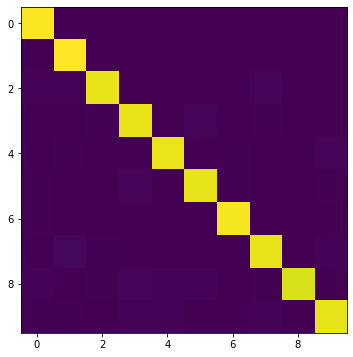

[[0.99 0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   1.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.01 0.01 0.97 0.   0.   0.   0.   0.01 0.   0.  ]
 [0.   0.   0.   0.97 0.   0.01 0.   0.01 0.   0.  ]
 [0.   0.01 0.   0.   0.97 0.   0.   0.   0.   0.02]
 [0.01 0.   0.   0.01 0.   0.96 0.01 0.   0.   0.  ]
 [0.01 0.   0.   0.   0.   0.   0.99 0.   0.   0.  ]
 [0.   0.02 0.   0.   0.   0.   0.   0.96 0.   0.01]
 [0.01 0.   0.   0.02 0.01 0.01 0.   0.   0.94 0.  ]
 [0.   0.   0.   0.01 0.01 0.   0.   0.01 0.   0.96]]
Testing Time is: 843.3191657066345


In [166]:
# display confusion matrix for your KNN classifier with all the training examples
# (This may take a while)
import time
""" ==========
YOUR CODE HERE
========== """
start_time = time.time()
M_ran,acc_ran = Confusion(testData, testLabels, knnClassifer)
VisualizeConfusion(M_ran)
end_time = time.time()
print("Testing Time is: {}".format(end_time - start_time))

#### Comments here on which number the number 2 is most often misclassified as
The reason why number 2 is most ofteen misclassified is that:

### Part 4: Principal Component Analysis (PCA) K-Nearest Neighbors (KNN) [5 pts]
Here you will implement a simple KNN classifer in PCA space (for k=3 and 25 principal components).
You should implement PCA yourself using svd (you may not use sklearn.decomposition.PCA
or any other package that directly implements PCA transformations

Is the testing time for PCA KNN classifier more or less than that for KNN classifier? Comment on why it differs if it does.

In [16]:
class PCAKNNClassifer():
    def __init__(self, components=5, k=3):
        # components = number of principal components
        # k is the number of neighbors involved in voting
        """ ==========
        YOUR CODE HERE
        ========== """
        self.components = components
        self.k = k
        self.classifier = KNeighborsClassifier(n_neighbors=k)
        
    def train(self, trainData, trainLabels):
        """ ==========
        YOUR CODE HERE
        ========== """
        trainData = trainData.reshape(trainData.shape[0], -1)
        mean_trainData = trainData.mean(0)
        self.mean = mean_trainData
        central = trainData - mean_trainData
        cov = central.T @ central
        eigval, eigvec = np.linalg.eigh(cov)
        sorted_indices = np.argsort(eigval)
        self.w = eigvec[:,sorted_indices[:-self.components-1:-1]]
        #print(self.w.T.shape)
        #print(central.T.shape)
        y = trainLabels.reshape(trainLabels.shape[0], 1)
        X = self.w.T @ central.T
        #print(X.shape)
        #print(y.shape)
        self.classifier.fit(X.T, y)
        
        
        
    def __call__(self, x):
        # this method should take a batch of images
        # and return a batch of predictions
        """ ==========
        YOUR CODE HERE
        ========== """
        x = x.reshape(x.shape[0], -1)
        x = x - self.mean
        x = (self.w.T @ x.T).T
        return self.classifier.predict(x)
        

# test your classifier with only the first 100 training examples (use this
# while debugging)
pcaknnClassiferX = PCAKNNClassifer()
pcaknnClassiferX.train(trainData[:100], trainLabels[:100])
print ('KNN classifier accuracy: %f'%test(testData, testLabels, pcaknnClassiferX))

/home/zhizuo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
200it [00:00, 459.54it/s]

KNN classifier accuracy: 50.410000


/home/zhizuo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


0.9731


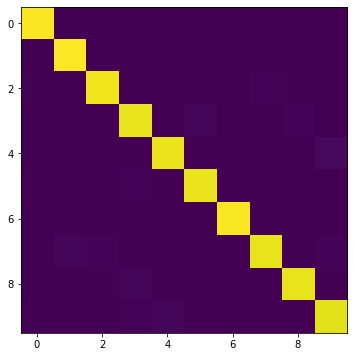

[[0.99 0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   1.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.98 0.   0.   0.   0.   0.01 0.   0.  ]
 [0.   0.   0.   0.96 0.   0.01 0.   0.01 0.01 0.  ]
 [0.   0.   0.   0.   0.97 0.   0.   0.   0.   0.03]
 [0.01 0.   0.   0.01 0.   0.97 0.01 0.   0.   0.  ]
 [0.   0.   0.   0.   0.   0.   0.99 0.   0.   0.  ]
 [0.   0.02 0.01 0.   0.   0.   0.   0.96 0.   0.01]
 [0.   0.   0.   0.02 0.   0.01 0.   0.   0.96 0.  ]
 [0.   0.01 0.   0.01 0.01 0.   0.   0.   0.   0.95]]
Testing Time is: 6.841451168060303


In [18]:
# test your classifier with all the training examples
import time
pcaknnClassifer = PCAKNNClassifer(components=25)
pcaknnClassifer.train(trainData, trainLabels)
# display confusion matrix for your PCA KNN classifier with all the training examples
""" ==========
YOUR CODE HERE
========== """
start_time = time.time()
M_ran,acc_ran = Confusion(testData, testLabels, pcaknnClassifer)
VisualizeConfusion(M_ran)
end_time = time.time()
print("Testing Time is: {}".format(end_time - start_time))


#### Comments here on PCA vs PCA KNN testing time and the reasoning

## Part 4: Answer
As we can see, if we use vanilla KNN Classifer, the testing time is 785 seconds. However, if we use PCA KNN Classifier, the testing time reduced to 7.53 seconds. The difference between the above two methods is the data's dimension. The vanilla methods use 28 * 28 = 784 dimension, while the pca only use top 25 components. So the time complexity will dramatically decreased.

What's more, the top 25 components have already had enough information. So its accuracy is reasonable.

## Problem 4: Deep learning [14 pts]
Below is some helper code to train your deep networks.

### Part 1:  Training with PyTorch [2 pts]
Below is some helper code to train your deep networks. 
Complete the train function for DNN below. You should write down the training operations in this function. That means, for a batch of data you have to initialize the gradients, forward propagate the data, compute error, do back propagation and finally update the parameters. This function will be used in the following questions with different networks.
You can look at https://pytorch.org/tutorials/beginner/pytorch_with_examples.html for reference.

In [19]:
# base class for your deep neural networks. It implements the training loop (train_net).
# You will need to implement the "__init__()" function to define the networks
# structures and "forward()", to propagate your data, in the following problems.
import torch.nn as nn
import torch.nn.init
import torch.optim as optim
from torch.autograd import Variable
from torch.nn.parameter import Parameter
from tqdm import tqdm
from scipy.stats import truncnorm

class DNN(nn.Module):
    def __init__(self):
        super(DNN, self).__init__()
        pass
    
    def forward(self, x):
        raise NotImplementedError
    
    def train_net(self, trainData, trainLabels, epochs=1, batchSize=50):
        criterion = nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.parameters(), lr = 3e-4)
        
        for epoch in range(epochs):
            self.train()  # set netowrk in training mode
            for i, (data,labels) in enumerate(DataBatch(trainData, trainLabels, batchSize, shuffle=True)):
                data = Variable(torch.FloatTensor(data))
                labels = Variable(torch.LongTensor(labels))
                optimizer.zero_grad()
                outputs = self.forward(data)
                loss = criterion(outputs,labels)
                loss.backward()
                optimizer.step()
                
                
            self.eval()  # set network in evaluation mode
            print ('Epoch:%d Accuracy: %f'%(epoch+1, test(testData, testLabels, self))) 
    
    def __call__(self, x):
        inputs = Variable(torch.FloatTensor(x))
        prediction = self.forward(inputs)
        return np.argmax(prediction.data.cpu().numpy(), 1)

# helper function to get weight variable
def weight_variable(shape):
    initial = torch.Tensor(truncnorm.rvs(-1/0.01, 1/0.01, scale=0.01, size=shape))
    return Parameter(initial, requires_grad=True)

# helper function to get bias variable
def bias_variable(shape):
    initial = torch.Tensor(np.ones(shape)*0.1)
    return Parameter(initial, requires_grad=True)

In [20]:
# example linear classifier - input connected to output
# you can take this as an example to learn how to extend DNN class
class LinearClassifier(DNN):
    def __init__(self, in_features=28*28, classes=10):
        super(LinearClassifier, self).__init__()
        # in_features=28*28
        self.weight1 = weight_variable((classes, in_features))
        self.bias1 = bias_variable((classes))
    
    def forward(self, x):
        # linear operation
        y_pred = torch.addmm(self.bias1, x.view(list(x.size())[0], -1), self.weight1.t())
        return y_pred
    
trainData=np.array(list(read('training','images')))
trainData=np.float32(np.expand_dims(trainData,-1))/255
trainData=trainData.transpose((0,3,1,2))
trainLabels=np.int32(np.array(list(read('training','labels'))))

testData=np.array(list(read('testing','images')))
testData=np.float32(np.expand_dims(testData,-1))/255
testData=testData.transpose((0,3,1,2))
testLabels=np.int32(np.array(list(read('testing','labels'))))

In [21]:
# test the example linear classifier (note you should get around 90% accuracy
# for 10 epochs and batchsize 50)
linearClassifier = LinearClassifier()
linearClassifier.train_net(trainData, trainLabels, epochs=10)

print ('Linear classifier accuracy: %f'%test(testData, testLabels, linearClassifier))

200it [00:00, 4627.94it/s]


Epoch:1 Accuracy: 89.200000


200it [00:00, 4270.08it/s]


Epoch:2 Accuracy: 90.710000


200it [00:00, 3739.84it/s]


Epoch:3 Accuracy: 91.340000


200it [00:00, 4673.37it/s]


Epoch:4 Accuracy: 91.650000


200it [00:00, 2327.03it/s]


Epoch:5 Accuracy: 91.840000


200it [00:00, 4228.00it/s]


Epoch:6 Accuracy: 91.970000


200it [00:00, 4890.15it/s]


Epoch:7 Accuracy: 92.270000


200it [00:00, 4941.04it/s]


Epoch:8 Accuracy: 92.340000


200it [00:00, 4569.31it/s]


Epoch:9 Accuracy: 92.390000


200it [00:00, 4829.06it/s]
200it [00:00, 4782.01it/s]

Epoch:10 Accuracy: 92.300000
Linear classifier accuracy: 92.300000


0.923


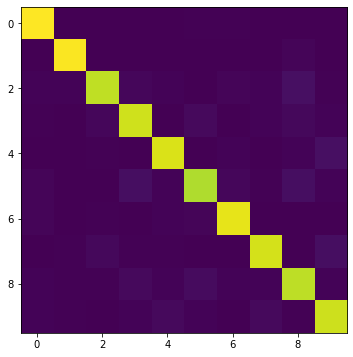

[[0.98 0.   0.   0.   0.   0.   0.01 0.   0.   0.  ]
 [0.   0.98 0.   0.   0.   0.   0.   0.   0.01 0.  ]
 [0.01 0.01 0.89 0.02 0.01 0.   0.01 0.01 0.04 0.  ]
 [0.   0.   0.02 0.91 0.   0.02 0.   0.01 0.02 0.01]
 [0.   0.   0.   0.   0.93 0.   0.01 0.   0.01 0.04]
 [0.01 0.   0.   0.04 0.01 0.87 0.02 0.01 0.04 0.01]
 [0.01 0.   0.01 0.   0.01 0.01 0.95 0.   0.   0.  ]
 [0.   0.   0.02 0.01 0.   0.   0.   0.92 0.   0.04]
 [0.01 0.01 0.01 0.02 0.01 0.03 0.01 0.01 0.88 0.01]
 [0.01 0.01 0.   0.01 0.03 0.01 0.   0.02 0.01 0.91]]


In [22]:
# display confusion matrix
""" ==========
YOUR CODE HERE
========== """
M_ran,acc_ran = Confusion(testData, testLabels, linearClassifier)
VisualizeConfusion(M_ran)

### Part 2: Single Layer Perceptron [2 pts]
The simple linear classifier implemented in the cell already performs quite well. Plot the filter weights corresponding to each output class (weights, not biases) as images. (Normalize weights to lie between 0 and 1 and use color maps like 'inferno' or 'plasma' for good results). Comment on what the weights look like and why that may be so.


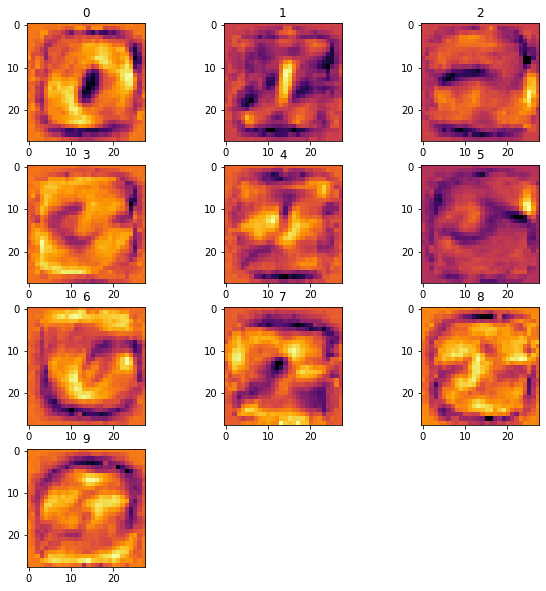

In [23]:
# Plot filter weights corresponding to each class, you may have to reshape them to make sense out of them
# linearClassifier.weight1.data will give you the first layer weights
""" ==========
YOUR CODE HERE
========== """
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
plt.subplot2grid((4,3), (0,0))
plt.title("0")
x = linearClassifier.weight1.data[0,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (0,1))
plt.title("1")
x = linearClassifier.weight1.data[1,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (0,2))
plt.title("2")
x = linearClassifier.weight1.data[2,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (1,0))
plt.title("3")
x = linearClassifier.weight1.data[3,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (1,1))
plt.title("4")
x = linearClassifier.weight1.data[4,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (1,2))
plt.title("5")
x = linearClassifier.weight1.data[5,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (2,0))
plt.title("6")
x = linearClassifier.weight1.data[6,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (2,1))
plt.title("7")
x = linearClassifier.weight1.data[7,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (2,2))
plt.title("8")
x = linearClassifier.weight1.data[8,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')

plt.subplot2grid((4,3), (3,0))
plt.title("9")
x = linearClassifier.weight1.data[9,:].reshape(28,28)
x = (x - x.min())/(x.max() - x.min())
plt.imshow(x, cmap='inferno')
plt.show()

#### Comments on weights
The weights are similar to the digits themself. The reason why it is been like this is that the weights will multiply with the digits, the respond may need to be large if it is the true label. So it will look like the average of its relative digits.

But, it is not very clear in some case. Only digits 0,1,3,6 are very clear.

### Part 3: Multi Layer Perceptron (MLP) [5 pts]
Here you will implement an MLP. The MLP should consist of 2 layers (matrix multiplication and bias offset) that map to the following feature dimensions:

* 28x28 -> hidden (100)
* hidden -> classes

* The hidden layer should be followed with a ReLU nonlinearity. The final layer should not have a nonlinearity applied as we desire the raw logits output.
* The final output of the computation graph should be stored in self.y as that will be used in the training.

Display the confusion matrix and accuracy after training. Note: You should get ~ 97 % accuracy for 10 epochs and batch size 50.

Plot the filter weights corresponding to the mapping from the inputs to the first 10 hidden layer outputs (out of 100). Do the weights look similar to the weights plotted in the previous problem? Why or why not?

In [24]:
class MLPClassifer(DNN):
    def __init__(self, in_features=28*28, classes=10, hidden=100):
        super(MLPClassifer, self).__init__()
        """ ==========
        YOUR CODE HERE
        ========== """
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(in_features, hidden)
        self.relu1 = nn.ReLU(inplace=True)
        self.linear2 = nn.Linear(hidden, classes)
        #self.relu2 = nn.ReLU(inplace=True)
        
    
    def forward(self, x):
        """ ==========
        YOUR CODE HERE
        ========== """
        x = self.flatten(x)
        x = self.linear1(x)
        x = self.relu1(x)
        x = self.linear2(x)
        #x = self.relu2(x)
        return x

mlpClassifer = MLPClassifer()
mlpClassifer.train_net(trainData, trainLabels, epochs=10, batchSize=50)

200it [00:00, 1547.10it/s]


Epoch:1 Accuracy: 91.920000


200it [00:00, 3013.56it/s]


Epoch:2 Accuracy: 93.380000


200it [00:00, 3573.85it/s]


Epoch:3 Accuracy: 94.570000


200it [00:00, 2973.20it/s]


Epoch:4 Accuracy: 95.280000


200it [00:00, 3202.09it/s]


Epoch:5 Accuracy: 96.010000


200it [00:00, 2631.70it/s]


Epoch:6 Accuracy: 96.210000


200it [00:00, 3296.06it/s]


Epoch:7 Accuracy: 96.500000


200it [00:00, 2958.93it/s]


Epoch:8 Accuracy: 96.710000


200it [00:00, 2078.78it/s]


Epoch:9 Accuracy: 96.780000


200it [00:00, 3586.24it/s]

Epoch:10 Accuracy: 97.130000


0.9713


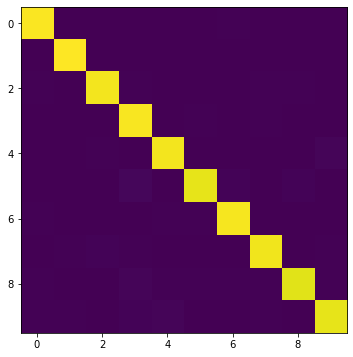

[[0.99 0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.99 0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.97 0.01 0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.98 0.   0.   0.   0.01 0.   0.  ]
 [0.   0.   0.   0.   0.98 0.   0.   0.   0.   0.01]
 [0.   0.   0.   0.02 0.   0.95 0.01 0.   0.01 0.  ]
 [0.01 0.   0.   0.   0.   0.01 0.98 0.   0.   0.  ]
 [0.   0.01 0.01 0.01 0.   0.   0.   0.97 0.   0.01]
 [0.01 0.   0.   0.01 0.01 0.01 0.01 0.01 0.95 0.01]
 [0.   0.01 0.   0.01 0.01 0.   0.   0.01 0.   0.95]]


In [25]:
# Plot confusion matrix
""" ==========
YOUR CODE HERE
========== """
M_ran,acc_ran = Confusion(testData, testLabels, mlpClassifer)

VisualizeConfusion(M_ran)

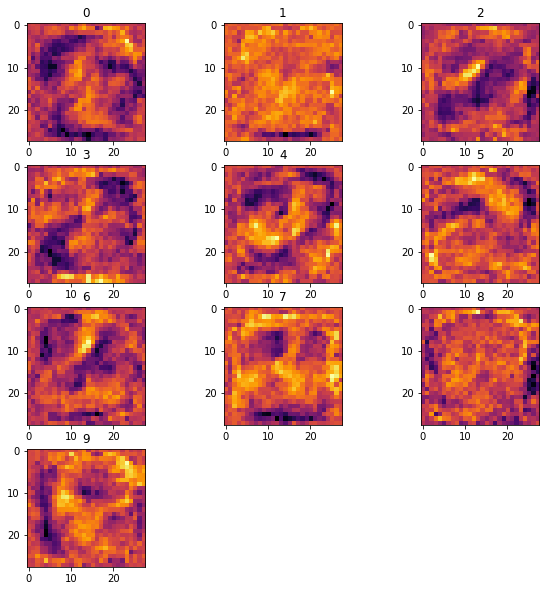

In [27]:
# Plot filter weights
""" ==========
YOUR CODE HERE
========== """
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))
for i in range(10):
    plt.subplot2grid((4,3), (i//3,i%3))
    plt.title("{}".format(i))
    x = mlpClassifer.linear1.weight.data.numpy()[i,:].reshape(28,28)
    x = (x - x.min())/(x.max() - x.min())
    plt.imshow(x, cmap='inferno')
plt.show()

#### Comments on weights:
The filter weights corresponding to the mapping from the inputs to the first 10 hidden layer outputs (out of 100) does not looks like the original digits at all. I think it is due to the following reason:
1. There are 100 hidden nodes, where each node is responsible for extracting different feature types, like edge detection, formation perception, etc.
2. Only responding by the original digits (like the previous part) is a very rough estimation and prediction, in that the hand written digit can be deformable a lot. Based on such numerous feature detector, the MLP can detect different features and concatenate them to identify which digits are.
3. In this part, we do not know which kind of feature of those 10 weights are, so we cannot identify why they look like this.



### Part 4: Convolutional Neural Network (CNN) [5 pts]
Here you will implement a CNN with the following architecture:

* n=5
* ReLU( Conv(kernel_size=5x5, stride=2, output_features=n) )
* ReLU( Conv(kernel_size=5x5, stride=2, output_features=n*2) )
* ReLU( Linear(hidden units = 64) )
* Linear(output_features=classes)

So, 2 convolutional layers, followed by 1 fully connected hidden layer and then the output layer

Display the confusion matrix and accuracy after training. You should get around ~ 98 % accuracy for 10 epochs and batch size 50.<br><br>
**Note: You are not allowed to use torch.nn.Conv2d() and torch.nn.Linear(), Using these will lead to deduction of points. Use the declared conv2d(), weight_variable() and bias_variable() functions.** Although, in practice, when you move forward after this class you will use torch.nn.Conv2d() which makes life easier and hides all the operations underneath.

In [ ]:
def weight_variable(shape):
    initial = torch.Tensor(truncnorm.rvs(-1/0.01, 1/0.01, scale=0.01, size=shape))
    return Parameter(initial, requires_grad=True)

# helper function to get bias variable
def bias_variable(shape):
    initial = torch.Tensor(np.ones(shape)*0.1)
    return Parameter(initial, requires_grad=True)

In [38]:
def conv2d(x, W, stride, bias=None):
    # x: input
    # W: weights (out, in, kH, kW)
    return F.conv2d(x, W, bias, stride=stride, padding=2)

# Defining a Convolutional Neural Network
class CNNClassifer(DNN):
    def __init__(self, classes=10, n=5):
        super(CNNClassifer, self).__init__()
        """ ==========
        YOUR CODE HERE
        ========== """
        self.stride = 2
        self.classes = classes
        self.weight1 = weight_variable((n,1,5,5))
        self.weight2 = weight_variable((n*2,n,5,5))
        
        self.bias1 = bias_variable((n,14,14))
        self.bias2 = bias_variable((n*2,7,7))
        
        self.weight3= weight_variable((64,7*7*classes))
        self.bias3 = bias_variable((64))
        self.weight4= weight_variable((classes,64))
        self.bias4 = bias_variable((classes))
        
    def forward(self, x):
        """ ==========
        YOUR CODE HERE
        ========== """
        h1 = conv2d(x,self.weight1,self.stride)
        h1.add_(self.bias1)
        relu1 = h1.clamp(min=0)
        
        h2 = conv2d(relu1,self.weight2,self.stride)
        h2.add_(self.bias2)
        relu2 = h2.clamp(min=0)
        
        m,_,_,_ = relu2.size()
        vec = relu2.view(m,-1)
        h3 = torch.addmm(self.bias3 , vec, self.weight3.t())
        relu3 = h3.clamp(min=0) ## perform relu function
        y_pred = torch.addmm(self.bias4, relu3, self.weight4.t())
        return y_pred
        
cnnClassifer = CNNClassifer()
cnnClassifer.train_net(trainData, trainLabels, epochs=10)

200it [00:00, 736.77it/s]


Epoch:1 Accuracy: 91.570000


200it [00:00, 761.78it/s]


Epoch:2 Accuracy: 94.850000


200it [00:00, 928.50it/s] 


Epoch:3 Accuracy: 95.760000


200it [00:00, 1022.54it/s]


Epoch:4 Accuracy: 96.790000


200it [00:00, 755.00it/s]


Epoch:5 Accuracy: 97.160000


200it [00:00, 770.23it/s]


Epoch:6 Accuracy: 97.330000


200it [00:00, 917.47it/s] 


Epoch:7 Accuracy: 97.590000


200it [00:00, 791.47it/s]


Epoch:8 Accuracy: 97.720000


200it [00:00, 754.33it/s]


Epoch:9 Accuracy: 98.000000


200it [00:00, 915.77it/s]

Epoch:10 Accuracy: 98.000000


0.98


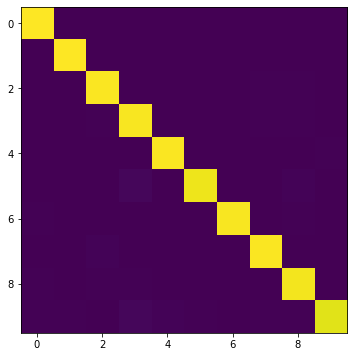

[[0.99 0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.99 0.   0.   0.   0.   0.   0.   0.   0.  ]
 [0.   0.   0.98 0.   0.   0.   0.   0.   0.01 0.  ]
 [0.   0.   0.   0.98 0.   0.   0.   0.   0.01 0.  ]
 [0.   0.   0.   0.   0.99 0.   0.   0.   0.   0.  ]
 [0.   0.   0.   0.02 0.   0.97 0.   0.   0.01 0.  ]
 [0.01 0.   0.   0.   0.   0.   0.98 0.   0.   0.  ]
 [0.   0.   0.01 0.   0.   0.   0.   0.98 0.   0.  ]
 [0.   0.   0.   0.01 0.   0.   0.   0.   0.98 0.  ]
 [0.   0.   0.   0.02 0.01 0.   0.   0.01 0.   0.95]]


In [43]:
# Plot confusion matrix
""" ==========
YOUR CODE HERE
========== """
M, accuracy = Confusion(testData, testLabels, cnnClassifer)
VisualizeConfusion(M)

* Note that the MLP/ConvNet approaches lead to an accuracy a little higher than the K-NN approach. 
* In general, Neural net approaches lead to significant increase in accuracy, but in this case since the problem is not too hard, the increase in accuracy is not very high.
* However, this is still quite significant considering the fact that the ConvNets we've used are relatively simple while the accuracy achieved using K-NN is with a search over 60,000 training images for every test image.
* You can look at the performance of various machine learning methods on this problem at http://yann.lecun.com/exdb/mnist/
* You can learn more about neural nets/ pytorch at<br> https://pytorch.org/tutorials/beginner/deep_learning_60min_blitz.html
* You can play with a demo of neural network created by Daniel Smilkov and Shan Carter at https://playground.tensorflow.org/